![Astrofisica Computacional](../logo.PNG)

---
## 03. PDEs II. Finite Differences Methods. Linear Advection Equation. 

Eduard Larrañaga (ealarranaga@unal.edu.co)

---

### Summary

Some methods for solving the linear advection equation of advection are presented.


---

## The Linear Advection Equation

Consider the continuity equation,

\begin{equation}
\frac{\partial \rho}{\partial t} + \vec{\nabla} \cdot (\rho \vec{v}) = 0
\end{equation}

in the particular case of a one-dimensional system and for a fluid that moves with constant speed,

\begin{equation}
\frac{\partial \rho}{\partial t} + {v}_x \frac{\partial \rho}{\partial x} = 0.
\end{equation}

This is an example of **first-order hyperbolic systems** in one spatial dimension and is called the **linear equation of advection**. Using the function $\psi=\psi(t,x)$ within this equation, we have

\begin{equation}
\partial_t \psi + v \partial_x \psi = 0\,\,,
\end{equation}

where $v$ is a constant. An exact solution of this equation is given by any function that depends on the arguments

\begin{equation}
\psi(t,x) = \psi(x\pm vt)\,\,.
\end{equation}

In this way, the advection equation will translate the given initial profile along the x-axis with a constant speed $v$.

---

## Solution Methods for the Advection Equation

### 1. FTCS Discretization

This finite difference method is based on discretizing the forward time derivative and the centered space derivative. Its name comes from the acronym in English (**F**orward in **T**ime, **C**entered in **S**pace: FTCS). This discretization immediately leads to the relation

\begin{equation}
  \psi^{(n+1)}_j = \psi^{(n)}_j - \frac{v \Delta t}{2\Delta x} \left(\psi^{(n)}_{j +1} - \psi^{(n)}_{j-1}\right)\,\,.
\end{equation}

In this equation, the index $n$ refers to the temporal discretization while the index $j$ refers to the spatial discretization.

**Boundary conditions**

It is important to note that in this method, the mesh definition needs a criterion to deal with the boundary conditions. Some of the possible criteria are:

- *Outflow* : the information of the last internal points is copied to the border points. In this case the profile leaves the integration domain without being returned.

- *Periodic Condition* : The information of the points of the border in one of the extremes is copied in the other extreme. In this case, the profile leaves one of the ends of the integration domain to reappear at the other end.


**Stability (Von Neumann)**

The stability of the method is analyzed by introducing the function $\psi(x_j,t_0) = \psi_j^{(0)} = e^{ikx_j} = e^{ikj\Delta x} $ in the discretized equation. This is the result

\begin{equation}
\begin{aligned}
\psi^{(1)}_j &= e^{ik j\Delta x } - \frac{v \Delta t}{2\Delta x} \left(e^{ik (j+1)\Delta x } - e^{ik (j-1) \Delta x }\right)\,\,,\\
\psi^{(1)}_j &= \left[ 1 - \frac{v\Delta t}{2 \Delta x} \left( e^{ik\Delta x} - e^{-ik\Delta x } \right) \right] e^{ik j \Delta x }\,\,,\\
\psi^{(1)}_j &= \underbrace{\left[ 1- \frac{v\Delta t}{\Delta x} i \sin(k\Delta x) \right]}_{{=\ xi}} e^{ik j \Delta x }\,\,,
\end{aligned}
\end{equation}

After $n$ iterations,

\begin{equation}
\begin{aligned}
\psi^{(n)}_j &= \left[ 1- \frac{v\Delta t}{\Delta x} i \sin(k\Delta x) \right]^n e^{ik j \Delta x } = \xi^n e^{ik j \Delta x }\,\,.
\end{aligned}
\end{equation}

The coefficient $\xi$ satisfies

\begin{equation}
|\xi| = \sqrt{\xi \xi^*} = \sqrt{1 + \left(\frac{v\Delta t}{\Delta x} \sin(k\Delta x)\right)^2} > 1\ ,\,,
\end{equation}

which implies that the FTCS method is **unconditionally unstable** for the advection equation!

### Example

Advection is an important process in many areas of astrophysics. For example, some transport models in the heliosphere consider shock-accelerated particle distributions (Litvinenko-2014) that are described, to a first approximation, by a one-dimensional advection-diffusion equation for particle density. In the weak diffusion approximation, the equation to be solved is

\begin{equation}
\frac{\partial \psi}{\partial t} + v\frac{\partial \psi}{\partial x} = 0\,\,,
\end{equation}

where $v$ represents the constant advection speed that can be interpreted as the speed of the solar wind.

As a first example to solve this partial differential equation, a Gaussian profile will be advected,

\begin{equation}
 \Psi_0 = \psi(x,t=0) = e^{-\frac{(x-x_0)^2 }{2 \sigma^2}},
\end{equation}
 
where $x_0 = 30$, $\sigma = \sqrt{15}$, with a positive velocity $v = 0.1$ in the domain $[0,100]$.

In this case, the **outflow** criterion will be used for the borders.

---
### Time Evolution of the Solution

It is possible to create an animated movie that shows the time evolution of the solution using the [matplotlib.pyplot.animation](https://matplotlib.org/stable/api/animation_api.html) library.

FTCS Method
dt =  0.07000700070007
dx =  0.1001001001001001


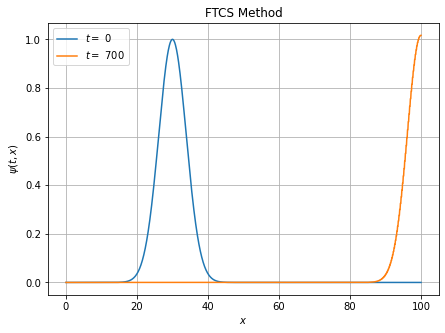

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Definition of the initial Gaussian profile
def gaussian(x):
    x0 = 30. 
    sigma = np.sqrt(15.)
    return np.exp(-(x-x0)**2/(2*sigma**2))


# Definition of the grids
x_i = 0.
x_f = 100.
Nx = 1000
xgrid = np.linspace(x_i, x_f, Nx)



t_i = 0.
t_f = 700.
Nt = 10000
tgrid = np.linspace(t_i, t_f, Nt)


# Velocity of the advection
v = 0.1


# FTCS Method
def FTCS(psi0, tgrid, xgrid, boundary='outflow'):
    print('FTCS Method')
    dt = tgrid[1] - tgrid[0]
    dx = xgrid[1] - xgrid[0]
    print('dt = ', dt)
    print('dx = ', dx)
    
    psi = np.zeros([len(tgrid), len(xgrid)])
    psi[0] = psi0(xgrid) # initial condition
    
    for n in range(len(tgrid)-1):
        for j in range(1,len(xgrid)-1):
            psi[n+1,j] = psi[n,j] - ((v*dt)/(2*dx))*(psi[n,j+1] - psi[n,j-1])
        if boundary=='outflow': # Outflow boundary conditions
            psi[n+1,0] = psi[n+1,1]
            psi[n+1,-1] = psi[n+1,-2]
        else: # Periodic boudnary conditions
            if v>0:
                psi[n+1,0] = psi[n+1,-2]
                psi[n+1,-1] = psi[n+1,-2]
            else:
                psi[n+1,0] = psi[n+1,1]
                psi[n+1,-1] = psi[n+1,0]
    return psi


psi = FTCS(gaussian, tgrid, xgrid, boundary='outflow')



plt.figure(figsize=(7,5))
plt.title('FTCS Method')
plt.plot(xgrid, psi[0,:], label=f'$t =$ {tgrid[0]:.0f}')
plt.plot(xgrid, psi[-1,:], label=f'$t =$ {tgrid[-1]:.0f}')
plt.xlabel(r'$x$')
plt.ylabel(r'$\psi(t,x)$')
plt.legend()
plt.grid()
plt.show()


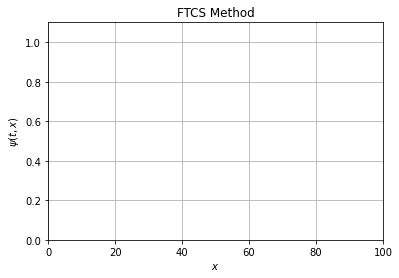

In [2]:
from matplotlib import animation
from IPython.display import HTML

%matplotlib inline

# Set up the figure, the axis, and the plot element we want to animate
fig, ax = plt.subplots()
plt.title('FTCS Method')
ax.set_xlim(( 0, 100))
ax.set_ylim((0, 1.1))
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$\psi(t,x)$')
plt.grid()

line, = ax.plot([], [], lw=2)

In [3]:
# Define the initialization function, which plots the background of each frame
def init():
    line.set_data([], [])
    return (line,)

def animate(i):
    x = xgrid
    y = psi[int(Nt/200)*i,:] # We take only some of the frames (given by 50*i)
    line.set_data(x, y)
    return (line,)

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=200, interval=20,  # only 200 frames with a duration of 20 ms each
                               blit=True)

In [4]:
HTML(anim.to_jshtml())


As shown above, the FTCS method is **unconditionally unstable** for the advection equation. That is why the bad behavior occurs in the final part of the previous animation.


To further illustrate this instability, we will now consider the advection of a gaussian profile with a time step $dt=0.05$ with periodic boundary conditions. Note that in the time interval $[0, 500]$ the behavior does not show instabilities,

FTCS Method
dt =  0.05
dx =  0.10020040080160321


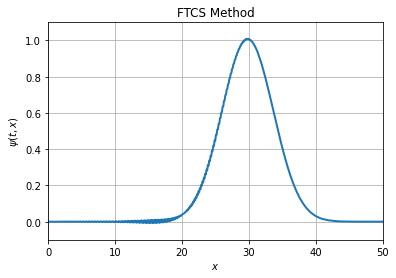

In [5]:
# Definition of the grids
x_i = 0.
x_f = 50.
Nx = 500
xgrid = np.linspace(x_i, x_f, Nx)


t_i = 0.
t_f = 500.
dt = 0.05
tgrid = np.arange(t_i, t_f, dt)
Nt = len(tgrid)

# Velocity of the advection
v = 0.1


psi = FTCS(gaussian, tgrid, xgrid, boundary='periodic')


# Set up the figure, the axis, and the plot element we want to animate
fig, ax = plt.subplots()
plt.title('FTCS Method')

ax.set_xlim(( 0, 50))
ax.set_ylim((-0.1, 1.1))
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$\psi(t,x)$')
plt.grid()

line, = ax.plot([], [], lw=2)

# Define the initialization function, which plots the background of each frame
def init():
    line.set_data([], [])
    return (line,)

def animate(i):
    x = xgrid
    step = int(Nt/200)
    y = psi[step*i] # We take only some of the frames (given by 50*i)
    line.set_data(x, y)
    return (line,)

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=200, interval=20,  # only 200 frames with a duration of 20 ms each
                               blit=True)

HTML(anim.to_jshtml())

However, by extending the time interval to $[0,750]$, instability appears,

FTCS Method
dt =  0.05
dx =  0.10020040080160321


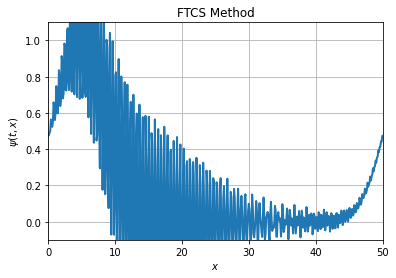

In [6]:

# Definition of the grids
x_i = 0.
x_f = 50.
Nx = 500
xgrid = np.linspace(x_i, x_f, Nx)


t_i = 0.
t_f = 750.
dt = 0.05
tgrid = np.arange(t_i, t_f, dt)
Nt = len(tgrid)


# Velocity of the advection
v = 0.1


psi = FTCS(gaussian, tgrid, xgrid, boundary='periodic')


# Set up the figure, the axis, and the plot element we want to animate
fig, ax = plt.subplots()
plt.title('FTCS Method')

ax.set_xlim(( 0, 50))
ax.set_ylim((-0.1, 1.1))
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$\psi(t,x)$')
plt.grid()

line, = ax.plot([], [], lw=2)

# Define the initialization function, which plots the background of each frame
def init():
    line.set_data([], [])
    return (line,)

def animate(i):
    x = xgrid
    step = int(Nt/200)
    y = psi[step*i] # We take only some of the frames (given by 50*i)
    line.set_data(x, y)
    return (line,)

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=200, interval=20,  # only 200 frames with a duration of 20 ms each
                               blit=True)

HTML(anim.to_jshtml())

---

### 2. Upwind method

In this solution method, a discretization of first order in time and first order in space is considered. For the spatial derivative there are two possibilities,

\begin{equation}
\begin{aligned}
\frac{\partial \psi}{\partial x} &\approx \frac{1}{\Delta x}(\psi_j - \psi_{j-1}) \hspace{1cm}\text{finite differences towards the right (upwind)}\\
\frac{\partial \psi}{\partial x} &\approx \frac{1}{\Delta x}(\psi_{j+1} - \psi_{j})
\hspace{1cm}\text{finite differences to the left (downwind)}
\end{aligned}
\end{equation}

The two possibilities are called lateral approximations because they use information from one side or the other of the point $x_j$. Incorporating these discretizations into the advection equation gives

\begin{equation}
\begin{aligned}
\psi_j^{(n+1)} &= \psi_j^{(n)} - \frac{v\Delta t}{\Delta x} \left(\psi_j^{(n)} - \psi_{j -1}^{(n)}\right) \hspace{1cm}\text{(upwind)}\\
\psi_j^{(n+1)} &= \psi_j^{(n)} - \frac{v\Delta t}{\Delta x} \left(\psi_{j+1}^{(n)} - \psi_{j}^{(n)}\right) \hspace{1cm}\text{(downwind)}\,\,.
\end{aligned}
\end{equation}


**Stability**

A stability analysis shows that the upwind method is stable if

\begin{equation}
0 \le \frac{v \Delta t}{\Delta x} \le 1\,\,,
\end{equation}

while the downwind method is stable if

\begin{equation}
-1 \le \frac{v \Delta t}{\Delta x} \le 0\,\,,
\end{equation}

which confirms that for $v > 0$ the upwind must be used while for $v < 0$ the downwind must be used.

The condition

\begin{equation}
\alpha = \left|\frac{v\Delta t}{\Delta x}\right| \le 1\,\,
\end{equation}

is a mathematical realization of the principle of causality: *information propagation (via advection with speed $v$) in a time step $\Delta t$ must not "jump" forward beyond the size $\Delta x$ of an interval of the spatial mesh*.

The criterion $\alpha \le 1$ is usually called the **Courant-Friedrics-Lewy (CFL) condition** and is used to determine the allowed time step given the size of the spatial mesh $\Delta x$. Thus, the temporary step is often used

\begin{equation}
\Delta t = c_\mathrm{CFL} \frac{\Delta x}{|v|}\,\,,
\end{equation}

where $c_\mathrm{CFL} \le 1$ is called the CFL factor.

---
### 3. Lax-Friedrich method

The Lax-Friedrichs method, like the FTCS, is first order in time and second order in space. The corresponding equation is

\begin{equation}
\psi_{j}^{(n+1)} = \frac{1}{2}\left(\psi^{(n)}_{j+1} + \psi^{(n)}_{ j-1}\right) -
\frac{v \Delta t}{2\Delta x} \left(\psi^{(n)}_{j+1} - \psi^{(n)}_{j-1}\right)\ ,\,.
\end{equation}

From this equation it can be seen that this method differs from the FTCS method in that stability has been achieved for $\alpha \le 1$ by using the average of the old value (i.e. at $n$) at points $j+1$ and $j-1$ to compute the updated value (i.e, at $n+1$) at point $j$.
It is possible to show that this treatment is equivalent to including a dissipative term in the equations (in such a way that the instability of the FTCS method is damped) and therefore leads to a lower precision that manifests itself as a dissipation of the initial profile.

---
### 4. Leap-Frog Method

The **Leap Frog (LF)** method (also called the midpoint method) is second order in both time and space. This is given by the equation

\begin{equation}
\psi_j^{(n+1)} = \psi_j^{(n-1)} - \frac{v \Delta t}{\Delta
x} \left(\psi^{(n)}_{j+1} - \psi^{(n)}_{j-1}\right)\,\,.
\end{equation}

It is possible to show that this method is stable for $\alpha < 1$ and is characterized by **not being dissipative**. This means that the initial profile translates unchanged, but a detailed study shows that the modes that make up the profile do not move with the same speed, which can lead to high-frequency oscillations that are not damped (because a "numerical viscosity").

---

### 5. Lax-Wendroff method

The **Lax-Wendroff** method is an extension of the Lax-Friedrich method making it second order in time and space. The equation that defines it is

\begin{equation}
\psi_j^{(n+1)} = \psi_j^n - \frac{v\Delta t}{2\Delta x} \left(\psi_{j+1}^{(n)}
- \psi_{j-1}^{(n)} \right) + \frac{v^2(\Delta t)^2}{2(\Delta x)^2} \left(
\psi_{j-1}^{(n)} - 2 \psi_j^{(n)} + \psi_{j+1}^{(n)}\right)\,\,.
\end{equation}

This method has better precision than the Lax-Friedrich method and is stable for $\alpha \le 1$.